In [204]:
import pyproj

import os 
os.environ['PROJ_LIB'] = pyproj.datadir.get_data_dir()

!echo $PROJ_LIB

/Users/lishanguillemot/Documents/GitHub/pfeffel/.venv/lib/python3.10/site-packages/pyproj/proj_dir/share/proj


# Boris Bikes

In [205]:
import datetime

import h3 # uber geo package
import pandas as pd
import seaborn as sns
import numpy as np
import matplotlib
import matplotlib.pyplot as plt

from tqdm.auto import tqdm

In [206]:
tqdm.pandas()

TODO: this needs doesn't persist in initial notebook run and has to be run again separately and charts redrawn :( - fix

In [207]:
matplotlib.rcParams['figure.figsize'] = (20, 10)

In [208]:
pd.__version__

'1.4.3'

# Introduction

Context


# Data description and cleaning

Explain the steps for the data description.

## Load processed data 

load reference data for bike station locations

In [209]:
# TODO update
RAW = "../data/cleaned_data_20250820_2304.pickle"

LOCATION_REF = "../data/stations_loc.json"

In [210]:
station_locations_df = pd.read_json(LOCATION_REF).T

station_locations_df.head()

,lat,lon
85,51.500647,-0.078600
86,51.489479,-0.115156
87,51.516468,-0.079684
88,51.518587,-0.132053
89,51.526250,-0.123509


main data, load with dask

In [211]:
# load raw data
df = pd.read_pickle(RAW)

about 100M rows

In [212]:
# num rows
len(df)

3760109

In [213]:
len(df[df["bike_id"].isna()])

0

some cleaning of bad dates

In [214]:
EARLIEST_DATE = datetime.datetime(2010, 1, 1)

In [215]:
%%time
# filter out of range dates
df = df[df["start_date"] > EARLIEST_DATE]
# allow NA for end dates
df = df[(df["end_date"] > EARLIEST_DATE) | df["end_date"].isna()]

# also drop entries where start date before end date
df = df[df["start_date"] < df["end_date"]]

# recalc duration
df["duration"] = df["end_date"]  - df["start_date"] 

CPU times: user 616 ms, sys: 132 ms, total: 748 ms
Wall time: 765 ms


we've lost a few!

In [216]:
len(df)

3760109

# Statistics on bike usage

In [217]:
%%time
# how many bikes
df["bike_id"].nunique()

CPU times: user 101 ms, sys: 13 ms, total: 114 ms
Wall time: 115 ms


12400

In [218]:
bike_groups = df.groupby("bike_id")

In [219]:
%%time
# bike with the most trips
group_counts = bike_groups.count()["filename"] # pick abritrary column (without nulls) to get counts
b_id = group_counts.idxmax()
n_trips = group_counts.loc[b_id]

print(f"""
bike with most trips: {b_id}
did {n_trips} trips
""")


bike with most trips: 16841
did 748 trips

CPU times: user 364 ms, sys: 16.1 ms, total: 380 ms
Wall time: 385 ms


In [220]:
%%time
# bike with the longest trips
group_sums = bike_groups["duration"].sum()
b_id = group_sums.idxmax()
d_sum = group_sums.loc[b_id]


print(f"""
bike with longest sum duration of trips: {b_id}
total of {d_sum} seconds
""")


bike with longest sum duration of trips: 20242
total of 16 days 06:26:00 seconds

CPU times: user 16.7 ms, sys: 3.01 ms, total: 19.8 ms
Wall time: 19.2 ms


how long are trips? (excluding outliers)

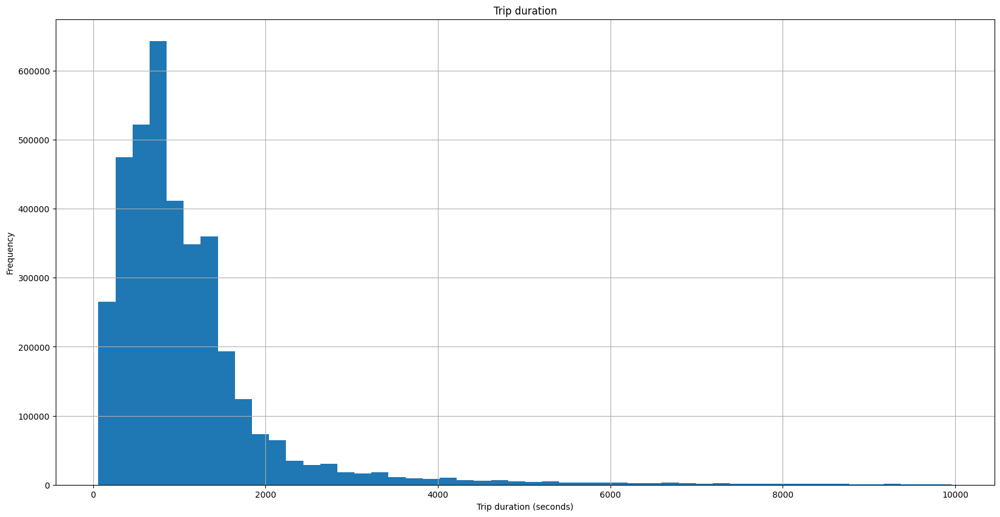

In [221]:

fig, ax = plt.subplots()
ax = df[df["duration"].dt.seconds < 10000]["duration"].dt.seconds.hist(bins=50)
plt.xlabel('Trip duration (seconds)')
plt.ylabel('Frequency')
plt.title('Trip duration')
plt.show()


## Long-lived bikes

In [222]:
%%time
trips_per_bike = bike_groups["filename"].count()
bike_start = bike_groups["start_date"].first()
bike_end = bike_groups["end_date"].last()

bike_lifetime = bike_end - bike_start

CPU times: user 302 ms, sys: 903 ms, total: 1.21 s
Wall time: 133 ms


how long is the lifetime of a bike? (in days)

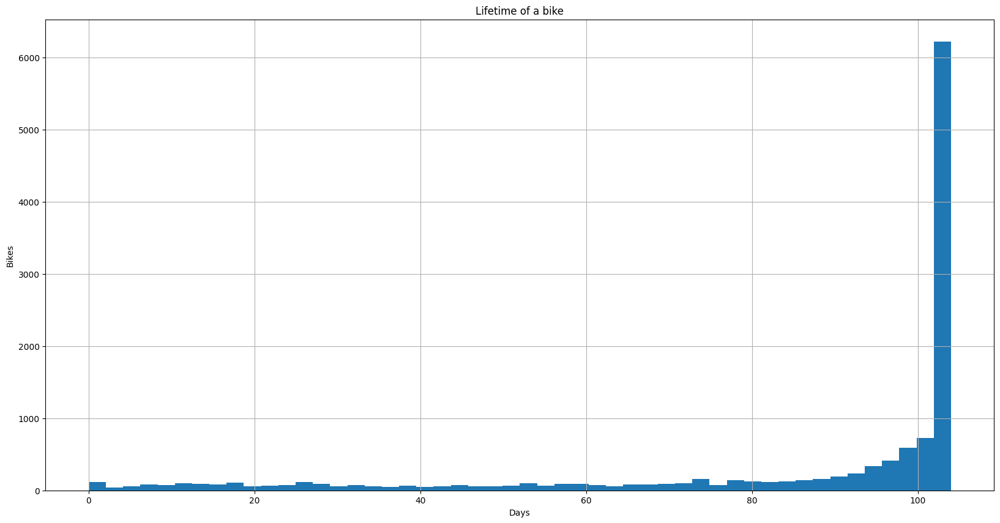

In [223]:

fig, ax = plt.subplots()
ax = bike_lifetime.dt.days.hist(bins=50)
plt.xlabel('Days')
plt.ylabel('Bikes')
plt.title('Lifetime of a bike')
plt.show()




what is the average utilisation of a bike? (total ride duration / lifetime)

this is the mean of the per bike utilisation. I.e. each bike's usage divided by it's total lifetime.

In [224]:
%%time
duration_sums = bike_groups["duration"].sum()
bike_utilisation = duration_sums / bike_lifetime
bike_utilisation.mean()

bike_utilisation.max()

CPU times: user 81.6 ms, sys: 11.4 ms, total: 93.1 ms
Wall time: 71.7 ms


1.0

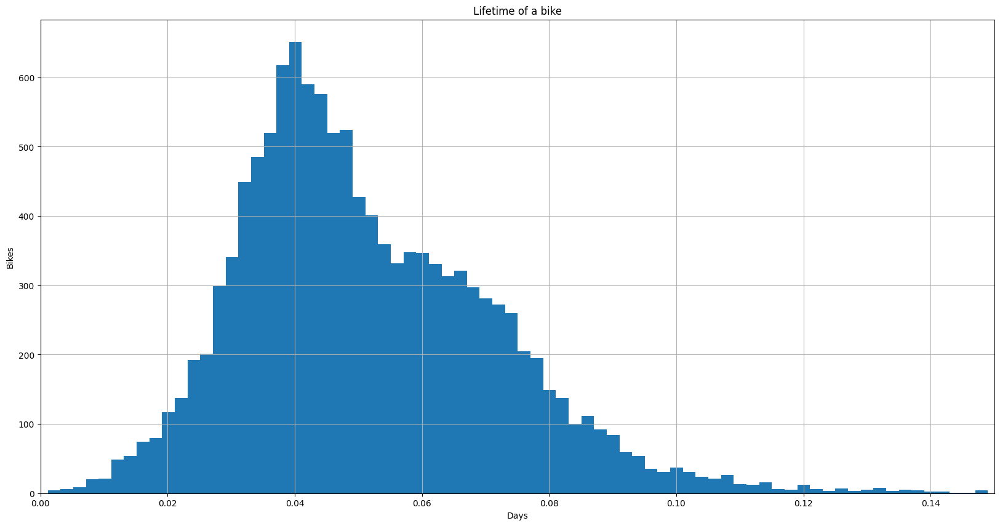

In [225]:

fig, ax = plt.subplots()
ax = bike_utilisation.hist(bins=500)
plt.xlim([0, 0.15])
plt.xlabel('Days')
plt.ylabel('Bikes')
plt.title('Lifetime of a bike')
plt.show()




### per month

- how many bikes are "alive" by month?

- how many stations are "alive" by month?

- what is bike utilisation by month? 

our utilisation measure here will be slightly different to previous figure. Previously we looked at per bike utilisation and averaged this. Now, we're looking at sum of use over the entire fleet and dividing this by the max possible usage per month (24/7 riding).

In [226]:
# don't want to incude first and last months as may be incompelte, use in filter later
incomplete_months = df["start_date"].iloc[[0, -1]].dt.to_period("M")


# create a complete monthly index that covers ALL months in period 
complete_monthly_index = pd.date_range(start=df["start_date"].iloc[0], end=df["end_date"].iloc[-1], freq="M").to_period("M")
# remove incomplete months
complete_monthly_index = complete_monthly_index.delete(complete_monthly_index.isin(incomplete_months))

In [227]:
# TODO should stations count as allive for next month rather than current?
def calc_alive_per_month(starts: pd.Series, ends: pd.Series, incomplete_months: pd.Series, complete_monthly_index: pd.PeriodIndex):
    starts_per_month = starts.dt.to_period("M").value_counts()
    ends_per_month = ends.dt.to_period("M").value_counts()

    counts_df = complete_monthly_index.to_frame(name="foo").join(starts_per_month).join(ends_per_month).sort_index().fillna(0)
    # ending items should only be counted at the start of next month, so shift
    counts_df["end_date"] = counts_df["end_date"].shift(1, fill_value=0)

    alive_per_month = counts_df["start_date"].cumsum() - counts_df["end_date"].cumsum()
    
    return alive_per_month[~alive_per_month.index.isin(incomplete_months)]

In [228]:
%%time

alive_bikes_per_month = calc_alive_per_month(starts=bike_start, ends=bike_end, incomplete_months=incomplete_months, complete_monthly_index=complete_monthly_index)

CPU times: user 10.9 ms, sys: 1.13 ms, total: 12 ms
Wall time: 3.83 ms


In [229]:
alive_bikes_per_month

2021-08    1161
2021-09    1194
2021-10    1292
Freq: M, dtype: int64

In [230]:
%%time
duration_sums_per_month = df[["duration"]].groupby(df["start_date"].dt.to_period("M"))["duration"].sum()

duration_sums_per_month = duration_sums_per_month.to_frame()
duration_sums_per_month["max_possible_duration"] = duration_sums_per_month.index.map(lambda x: x.end_time - x.start_time)

utilisation_per_month = duration_sums_per_month["duration"] / duration_sums_per_month["max_possible_duration"] / alive_bikes_per_month

# remove incomplelte months
utilisation_per_month = utilisation_per_month[~utilisation_per_month.index.isin(incomplete_months)]

CPU times: user 255 ms, sys: 19 ms, total: 274 ms
Wall time: 94.6 ms


In [231]:
%%time

station_groups = df.groupby("start_station_id")

# relies on time ordering of df via rental_id
station_start = station_groups["start_date"].first()
station_end = station_groups["end_date"].last()

CPU times: user 65.4 ms, sys: 8.75 ms, total: 74.1 ms
Wall time: 28.7 ms


In [232]:
# TODO should stations count as allive for next month rather than current?
def calc_alive_per_month(starts: pd.Series, ends: pd.Series, incomplete_months: pd.Series, complete_monthly_index: pd.PeriodIndex):
    starts_per_month = starts.dt.to_period("M").value_counts()
    ends_per_month = ends.dt.to_period("M").value_counts()

    counts_df = complete_monthly_index.to_frame(name="foo").join(starts_per_month).join(ends_per_month).sort_index().fillna(0)
    # ending items should only be counted at the start of next month, so shift
    counts_df["end_date"] = counts_df["end_date"].shift(1, fill_value=0)

    alive_per_month = counts_df["start_date"].cumsum() - counts_df["end_date"].cumsum()
    
    return alive_per_month[~alive_per_month.index.isin(incomplete_months)]

In [233]:
alive_bikes_per_month = calc_alive_per_month(df["start_date"], df["end_date"], incomplete_months, complete_monthly_index)



In [234]:

station_groups = df.groupby("start_station_id")
# relies on time ordering of df via rental_id
station_start = station_groups["start_date"].first()
station_end = station_groups["end_date"].last()

alive_stations_per_month = calc_alive_per_month(
    starts=station_start,
    ends=station_end,
    incomplete_months=incomplete_months,
    complete_monthly_index=complete_monthly_index,
)

In [235]:
duration_sums_per_month = df[["duration"]].groupby(df["start_date"].dt.to_period("M"))["duration"].sum()

duration_sums_per_month = duration_sums_per_month.to_frame()
duration_sums_per_month["max_possible_duration"] = duration_sums_per_month.index.map(lambda x: x.end_time - x.start_time)

utilisation_per_month = duration_sums_per_month["duration"] / duration_sums_per_month["max_possible_duration"] / alive_bikes_per_month

# remove incomplelte months
utilisation_per_month = utilisation_per_month[~utilisation_per_month.index.isin(incomplete_months)]

In [236]:
# forward fill gaps
stats_df = complete_monthly_index.to_frame(name="date")\
    .join(alive_bikes_per_month.rename("alive_bikes"))\
    .join(alive_stations_per_month.rename("alive_stations"))\
    .join(utilisation_per_month.rename("utilisation"))\
    .fillna(method="ffill") 

In [237]:
stats_df.head()

,date,alive_bikes,alive_stations,utilisation
2021-08,2021-08,1068915,4,0.000494
2021-09,2021-09,1175100,2,0.000471
2021-10,2021-10,1070352,2,0.000429


First month seems to be unusual, look from march 2012

In [238]:
stats_df[stats_df["alive_bikes"] < 0]

,date,alive_bikes,alive_stations,utilisation


In [239]:
# month with most alive stations 

stats_df.sort_values(by="alive_stations", ascending=False).head(5)

,date,alive_bikes,alive_stations,utilisation
2021-08,2021-08,1068915,4,0.000494
2021-09,2021-09,1175100,2,0.000471
2021-10,2021-10,1070352,2,0.000429


Text(0.5, 0, 'Years')

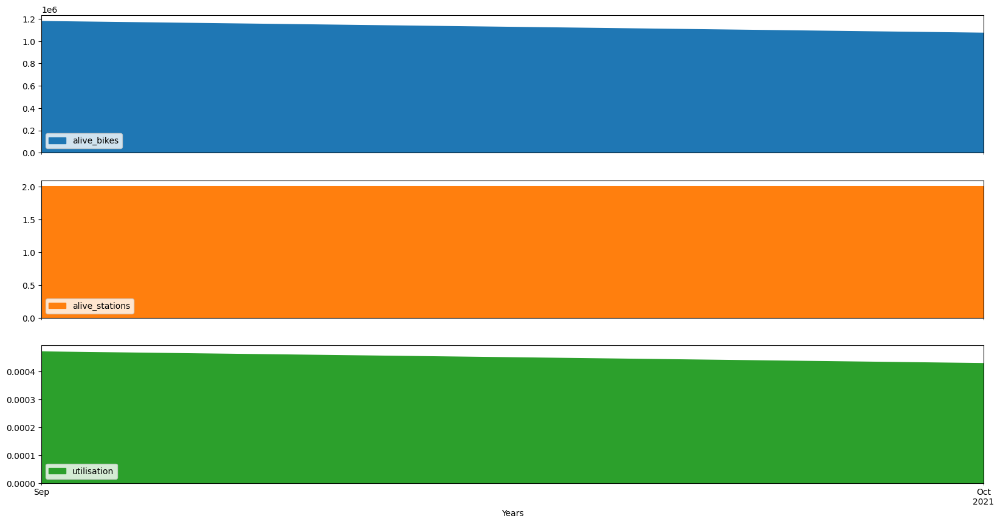

In [240]:

stats_df[1:].plot.area(subplots=True)
plt.xlabel('Years')


# chains

A "chain" is a sequence of trips for a given bike, where the start location matches the previous end location.

Run for some subset only. Try long lived bikes

In [241]:
top_ten_lived_bike_ids = bike_lifetime.sort_values()[-10:].index.values

In [242]:
top_ten_bike_subset = df[df["bike_id"].isin(top_ten_lived_bike_ids)].copy()

In [245]:
# NOTE - how to handle workshops?
# what if workshop is start ?
# what if workshop is end ?
def add_chains(bike_id: int, bike_group: pd.DataFrame, df: pd.DataFrame) -> None:
    """ note: adds to dataframe as side effect """

    # note fillna for end station to allow for comparison to NA
    breaks = bike_group[bike_group["start_station_id"] != bike_group.shift()["end_station_id"].fillna(-1)]
    break_indices = breaks.index.values

    chains = list()
    for i, (start, end) in enumerate(zip([None, *break_indices], [*break_indices, None])):
        chain = bike_group.loc[start:end]
        chain_id = f"{bike_id}_{i}"
        chains.append(pd.Series(chain_id, index=chain.index))
    return pd.concat(chains)

In [246]:
chains = list()
for k, g in tqdm(top_ten_bike_subset.groupby("bike_id")):
    g = bike_groups.get_group(k)
    chains.append(add_chains(bike_id=k, bike_group=g, df=df))

  0%|          | 0/10 [00:00<?, ?it/s]

ValueError: Cannot set non-string value '-1' into a StringArray.

In [ ]:
top_ten_bike_subset = top_ten_bike_subset.join(pd.concat(chains).rename("chain_id"))

In [ ]:
top_ten_bike_subset.to_pickle("top_ten_bikes.pickle")

# A day on the life of a bike


In [ ]:
def check_id(row, stations):
    start_id = str(int(row["start_station_id"]))
    end_id = str(int(row["end_station_id"]))
    if str(start_id) in stations.keys() and str(end_id) in stations.keys():
        return True
    return False

def remove_missing_stations(df, stations):
    df["check_stations_ids"] = df.apply(
        lambda row: check_id(row, stations), axis=1
    )
    df = df[df.check_stations_ids.eq(True)]
    return df


In [ ]:
import json
import os

import folium
import requests as requests
from folium import plugins


class Trip:
    def __init__(self, data, bike_id, trip_id, station_data):
        df = data[data.index == trip_id]

        self.init_station = {
            "name": df.start_station_name.values[0],
            "id": df.start_station_id.values[0],
            "latitude": station_data[str(int(df.start_station_id.values[0]))][
                "lat"
            ],
            "longitude": station_data[str(int(df.start_station_id.values[0]))][
                "lon"
            ],
        }
        self.end_station = {
            "name": df.end_station_name.values[0],
            "id": df.end_station_id.values[0],
            "latitude": station_data[str(int(df.end_station_id.values[0]))][
                "lat"
            ],
            "longitude": station_data[str(int(df.end_station_id.values[0]))][
                "lon"
            ],
        }
        self.bike = df.bike_id.values[0]
        self.duration = df.duration.values[0]
        self.date = {
            "start": df.start_date.values[0],
            "end": df.end_date.values[0],
        }
        self.circular = self.init_station == self.end_station
        self.route = {}
        self.bike_id = bike_id
        self.trip_id = trip_id

    def get_route(self, key):
        route_file_path = (
            "../output/routes/"
            + str(self.bike_id)
            + "_"
            + str(self.trip_id)
            + ".json"
        )
        if os.path.isfile(route_file_path):
            with open(route_file_path, "r") as fp:
                data = json.load(fp)
                self.route = data
        else:
            if self.circular:
                self.route = {}

            else:
                plans = ["balanced", "fastest", "quietest", "shortest"]

                closest_time = False
                trip_data = {}

                for plan in plans:
                    name = (
                        "https://www.cyclestreets.net/api/journey.json?key="
                        + key
                        + "&itinerarypoints="
                        + str(self.init_station["longitude"])
                        + ","
                        + str(self.init_station["latitude"])
                        + "|"
                        + str(self.end_station["longitude"])
                        + ","
                        + str(self.end_station["latitude"])
                        + "&plan="
                        + plan
                    )
                    data = requests.get(name).json()["marker"][0][
                        "@attributes"
                    ]
                    time = int(data["time"])
                    if closest_time is False:
                        closest_time = abs(time - self.duration)
                        trip_data = data

                    elif abs(self.duration - time) < closest_time:
                        closest_time = abs(time - self.duration)
                        trip_data = data

                self.route = trip_data

            with open(route_file_path, "w") as fp:
                json.dump(self.route, fp)

    def map(self):

        # Create base map
        London = [51.506949, -0.122876]
        map = folium.Map(
            location=London, zoom_start=14, tiles="CartoDB positron"
        )

        self.folium_route().add_to(map)

        return map

    def folium_route(self, key, colour="red"):

        if self.route == {}:
            self.get_route(key)

        coords = [
            (float(i.split(",")[1]), float(i.split(",")[0]))
            for i in self.route["coordinates"].split(" ")
        ]
        folium_route = folium.PolyLine(
            coords, color=colour, weight=5, opacity=0.8
        )

        return folium_route


In [ ]:
import folium


def get_colours(steps):
    colours = sns.color_palette("mako").as_hex()
    rev_colours = sns.color_palette("mako").as_hex()
    rev_colours.reverse()
    colours = rev_colours + colours
    while len(colours) < steps:
        colours += colours
    return colours

class Bike:
    def __init__(self, id):
        self.id = id

    def get_trips(self, df, stations):

        routes = [Trip(df, self.id, trip_id, stations) for trip_id in df.index]
        return routes

    def get_chains(self, stations):
        chain_ids = self.bike_rides.chain_id.to_list()
        chains = {}
        for chain_id in chain_ids:
            chain_rides = self.bike_rides[
                self.bike_rides["chain_id"] == chain_id
            ]
            chains[chain_id] = self.get_trips(chain_rides, stations)
        self.chains = chains

    def get_story(self, dataset, stations):
        bike_rides = dataset[dataset["bike_id"] == self.id]
        self.bike_rides = bike_rides
        self.get_chains(stations)


    def visualize_routes(self, key):

        # Create base map
        London = [51.506949, -0.122876]
        for chain_id, chain in self.chains.items():
            map = folium.Map(
                location=London, zoom_start=12, tiles="CartoDB positron"
            )
            colours = get_colours(len(chain))

            for counter, trip in enumerate(chain):
                trip.get_route(key)
                if trip.route == {}:
                    continue

                trip.folium_route(key, colours[counter]).add_to(map)

            f = "../output/" + str(self.id) + "_" + str(chain_id) + ".html"
            map.save(f)


In [ ]:
%matplotlib inline
import json
import pandas as pd

with open("../data/stations_loc.json") as f:
    stations = json.load(f)
#key = open("data/cycle_street_key.txt", "r").read()

data = pd.read_pickle("top_ten_bikes.pickle")

data = remove_missing_stations(data,stations)


# A day of the life of Boris bikes

In [ ]:
import os
from geopandas import GeoDataFrame, points_from_xy
import movingpandas as mpd
from shapely.geometry import Point
from datetime import datetime, timedelta
from folium.plugins import TimestampedGeoJson
from IPython.display import IFrame


def get_trajectory(bike_id):

    route_folder = "../output/routes/"
    chains = [
        filename
        for filename in sorted(os.listdir(route_folder))
        if str(bike_id) + "_" in filename
    ]
    
    

    times = []
    geometry = []
    colours = []

    many_colurs = get_colours(len(chains))

    for c in range(len(chains)):
        chain = chains[c]
        with open(route_folder + chain) as f:
            d = json.load(f)
        if len(d) > 0:
            geometry += [
                Point([float(y) for y in x.split(",")])
                for x in d["coordinates"].split(" ")
            ]
            if len(times) == 0:
                time_now = datetime.now()
            else:
                time_now = times[-1]
            times += [
                time_now + timedelta(seconds=1 * t + 1)
                for t in range(len(d["coordinates"].split(" ")))
            ]
            colours += [
                many_colurs[c] for x in range(len(d["coordinates"].split(" ")))
            ]

    df = pd.DataFrame()

    df["t"] = times
    df["trajectory_id"] = [1 for x in range(len(geometry))]
    df["sequence"] = [x + 1 for x in range(len(geometry))]
    df["colour"] = colours

    gdf = GeoDataFrame(df, crs="EPSG:4326", geometry=geometry)
    gdf = gdf.set_index("t")

    trajs = mpd.TrajectoryCollection(gdf, "trajectory_id")
    trajs = mpd.MinTimeDeltaGeneralizer(trajs).generalize(
        tolerance=timedelta(seconds=1)
    )
    traj = trajs.trajectories[0]
    return traj

def draw_map(traj):
    features = traj_to_timestamped_geojson(traj)
    # Create base map
    London = [51.506949, -0.122876]
    map = folium.Map(location=London, zoom_start=12, tiles="CartoDB positron")

    TimestampedGeoJson(
        {
            "type": "FeatureCollection",
            "features": features,
        },
        period="PT1S",
        add_last_point=True,
        transition_time=10,
    ).add_to(map)

    try:
        folium.PolyLine([(51.505, -0.09), (51.51, -0.1)], color="green", weight=100).add_to(map)
        folium.Marker((51.505, -0.09), tooltip="Test marker").add_to(map)
    except Exception as e:
        print("test overlay error:", e)
        pass

    from pathlib import Path
    out_dir = Path("..") / "output"
    out_dir.mkdir(parents=True, exist_ok=True)
    out_path = out_dir / "debug_map_inline.html"
    map.save(str(out_path))
    return IFrame(src=str(out_path), width=900, height=600)
    

def traj_to_timestamped_geojson(trajectory):
    features = []
    df = trajectory.df.copy()
    df["previous_geometry"] = df["geometry"].shift()
    df["time"] = df.index
    df["previous_time"] = df["time"].shift()
    for _, row in df.iloc[1:].iterrows():
        coordinates = [
            [
                row["previous_geometry"].xy[0][0],
                row["previous_geometry"].xy[1][0],
            ],
            [row["geometry"].xy[0][0], row["geometry"].xy[1][0]],
        ]
        times = [row["previous_time"].isoformat(), row["time"].isoformat()]
        features.append(
            {
                "type": "Feature",
                "geometry": {
                    "type": "LineString",
                    "coordinates": coordinates,
                },
                "properties": {
                    "times": times,
                    "style": {
                        "color": row["colour"],
                        "weight": 5,
                    },
                },
            }
        )
    return features


In [ ]:
bike_id = 893
selected_data =data[(data['start_date']> '2020-03-23') & (data['start_date']< '2020-05-14')]

key = 'f339aa90aba2b309'
bike = Bike(id=bike_id)
bike.get_story(selected_data, stations)
bike.visualize_routes(key)
traj = get_trajectory(bike_id)

In [ ]:
traj = get_trajectory(bike_id)
map_trajectory = draw_map(traj)


# Bike mobility patterns

In [ ]:
import json
import pickle
import re
import contextily as cx
import community
import networkx as nx
import numpy as np
import pandas as pd
from matplotlib import pyplot as plt

STATION_NAMES_FILE = "../data/station_names_20250820_0935.pickle"
STATION_COORDS_FILE = "../data/stations_loc.json"

TRIP_COUNT_THRESHOLD = 1e-5
MAP_BOUNDARIES = (-0.223, 0.005, 51.46, 51.555)
FONT_SIZE = 12
NODE_COLORMAP = "tab10"
MAX_NODE_SIZE = 300.0
MIN_NODE_SIZE = 5.0
MAX_EDGE_WIDTH = 3.0
MIN_EDGE_WIDTH = None
MAX_EDGE_ALPHA = 0.9
MIN_EDGE_ALPHA = None
EDGE_COLOUR = "#222222"
LABEL_STATIONS = [
     "Belgrove Street",
     "Waterloo Station 3",
     "Hyde Park Corner",
     "Aquatic Centre",
     "Bethnal Green Road",
     "Natural History Museum",
     "Kennington Oval",
     "Mudchute DLR",
]


def get_station_name(id):
    with open(STATION_NAMES_FILE, "rb") as f:
        station_allnames = pickle.load(f)

    name = sorted(station_allnames[id])[0]
    name = re.split(";|,|:", name)[0].strip()
    return name


def create_network_from_data(df, trip_count_threshold):
    trip_counts = (
        (
            df[["start_station_id", "end_station_id", "bike_id"]]
            .groupby(["start_station_id", "end_station_id"])
            .count()
        )
        .reset_index()
        .rename(columns={"bike_id": "trip_count"})
    )
    trip_counts = trip_counts.sort_values("trip_count")
    total_num_trips = trip_counts["trip_count"].sum()

    trip_counts = trip_counts[
        trip_counts["trip_count"] >= trip_count_threshold * total_num_trips
    ]

    graph = nx.from_pandas_edgelist(
        trip_counts,
        source="start_station_id",
        target="end_station_id",
        edge_attr="trip_count",
        create_using=nx.DiGraph,
    )

    return graph


def get_node_info(graph):
    with open(STATION_COORDS_FILE, "r") as f:
        station_latlon = json.load(f)

    nodes = graph.nodes()

    pos = [station_latlon[str(int(node))] for node in nodes]
    pos = [(p["lon"], p["lat"]) for p in pos]

    station_sizes = [i[1] for i in list(graph.degree(weight="trip_count"))]

    labels = [get_station_name(int(node)) for node in nodes]

    nodes_df = pd.DataFrame(
        {"id": list(nodes), "pos": pos, "size": station_sizes, "name": labels}
    )

    return nodes_df


def network_community_detection(graph, edge_weight):
    graph_undirected = nx.Graph()
    undirected_edges = set(sorted(graph.edges))
    for edge in undirected_edges:
        reverse_edge = (edge[1], edge[0])
        trip_count = graph.edges[edge][edge_weight]
        if reverse_edge in graph.edges:
            trip_count += graph.edges[reverse_edge][edge_weight]
        graph_undirected.add_edge(edge[0], edge[1], trip_count=trip_count)

    partition = community.best_partition(graph_undirected, weight=edge_weight)
    df_partition = pd.DataFrame(partition, index=[0]).T.reset_index()
    df_partition.columns = ["id", "partition"]

    return df_partition



def _scale_range(values, min_scaled, max_scaled):
    values = np.array(values)
    if min_scaled is not None:
        max_value = np.max(values)
        min_value = np.min(values)
        mult_coeff = (max_scaled - min_scaled) / (max_value - min_value)
        add_coeff = (max_value * min_scaled - min_value * max_scaled) / (
            max_value - min_value
        )
        scaled = mult_coeff * values + add_coeff
    else:
        max_value = np.max(values)
        scaled = max_scaled * values / max_value
    return scaled


def _drop_stations_without_location(graph):
    with open(STATION_COORDS_FILE, "r") as f:
        station_latlon = json.load(f)
    nodes = tuple(graph.nodes)
    stations_with_location = tuple(map(int, station_latlon.keys()))
    for n in nodes:
        if n not in stations_with_location:
            print(f"Removing node {n} because of missing location data.")
            graph.remove_node(n)
    return None


def create_network_and_map(
    df,
    allow_self_loops=False,
    min_edge_width=MIN_EDGE_WIDTH,
    min_edge_alpha=MIN_EDGE_ALPHA,
    arrows=True,
):
    community_graph = create_network_from_data(df, TRIP_COUNT_THRESHOLD)
    _drop_stations_without_location(community_graph)
    nodes_info = get_node_info(community_graph)
    visualisation_graph = community_graph.copy()
    if not allow_self_loops:
        visualisation_graph.remove_edges_from(
            nx.selfloop_edges(community_graph)
        )
    community_df = network_community_detection(community_graph, "trip_count")
    nodes_info = nodes_info.merge(community_df, on="id")
    nodes_info = nodes_info.sort_values(by="size", ascending=False)
    del community_df

    nodes_info['lon'] = [p[0] for p in nodes_info["pos"]]
    nodes_info['lat'] = [p[1] for p in nodes_info["pos"]]

    nodes_info = GeoDataFrame(nodes_info,geometry=points_from_xy(nodes_info.lon, nodes_info.lat),crs="EPSG:4326")
    
    labels = {
        id: name
        for id, name in zip(nodes_info["id"], nodes_info["name"])
        if name in LABEL_STATIONS
    }

    fig, ax = plt.subplots(
        1, 1, figsize=(20, 15)
    )
    nodes_info.plot(ax=ax,markersize=1)
    cx.add_basemap(ax,crs=nodes_info.crs,source=cx.providers.CartoDB.Positron)

    xynps = [np.array([p[0] for p in nodes_info["pos"]]),
        np.array([p[1] for p in nodes_info["pos"]])]
    pos = {
        k: (xynps[0][i], xynps[1][i]) for i, k in enumerate(nodes_info["id"])
    }

    sizes = _scale_range(nodes_info["size"], MIN_NODE_SIZE, MAX_NODE_SIZE)
    weights = np.array(
        [
            visualisation_graph.edges[e]["trip_count"]
            for e in visualisation_graph.edges
        ]
    )
    weights = _scale_range(weights, min_edge_width, MAX_EDGE_WIDTH)
    edge_alpha = _scale_range(weights, min_edge_alpha, MAX_EDGE_ALPHA)

    # Plots
    nx.draw_networkx_nodes(
        visualisation_graph,
        pos=pos,
        nodelist=nodes_info["id"],
        node_color=nodes_info["partition"],
        alpha=1.0,
        node_size=sizes,
        cmap=NODE_COLORMAP,
        ax=ax,
    )
    nx.draw_networkx_edges(
        visualisation_graph,
        pos=pos,
        edge_color=EDGE_COLOUR,
        width=weights,
        alpha=edge_alpha,
        arrows=arrows,
        ax=ax,
    )
    nx.draw_networkx_labels(
        visualisation_graph,
        pos=pos,
        labels=labels,
        font_size=FONT_SIZE,
        ax=ax,
    )
    return fig, ax, nodes_info


In [ ]:
from datetime import datetime

import pandas as pd
from matplotlib import pyplot as plt


# DATA_FILE = "../data/cleaned_data_latest.pickle"
DATA_FILE = "../data/cleaned_data_20250820_0907.pickle"

HARD_START_DATE = datetime(year=2010, month=1, day=1)

start_date = datetime(year=2021, month=1, day=1)
end_date = datetime(year=2022, month=1, day=1)

df = df[
    (df["start_date"] > HARD_START_DATE) & (df["end_date"] > HARD_START_DATE)
]
df_year = df[(df["start_date"] > start_date) & (df["start_date"] < end_date)]



Plotting mornings
Number of communities: 6


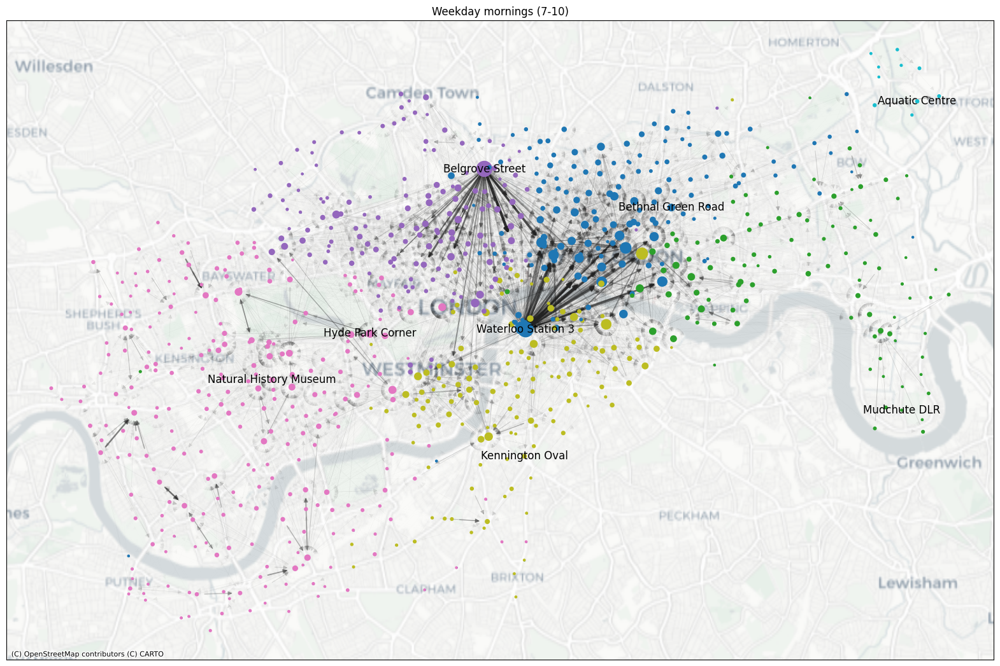

In [ ]:
print("Plotting mornings")
df_year_mornings = df[
    df["start_date"].dt.hour.isin([7, 8, 9, 10])
    & df["start_date"].dt.weekday.isin((0, 1, 2, 3, 4))
]
fig, ax, nodes_info = create_network_and_map(df_year_mornings)
num_communities = len(nodes_info["partition"].unique())
print(f"Number of communities: {num_communities}")
plt.title("Weekday mornings (7-10)")
plt.show()



Plotting afternoons
Number of communities: 12


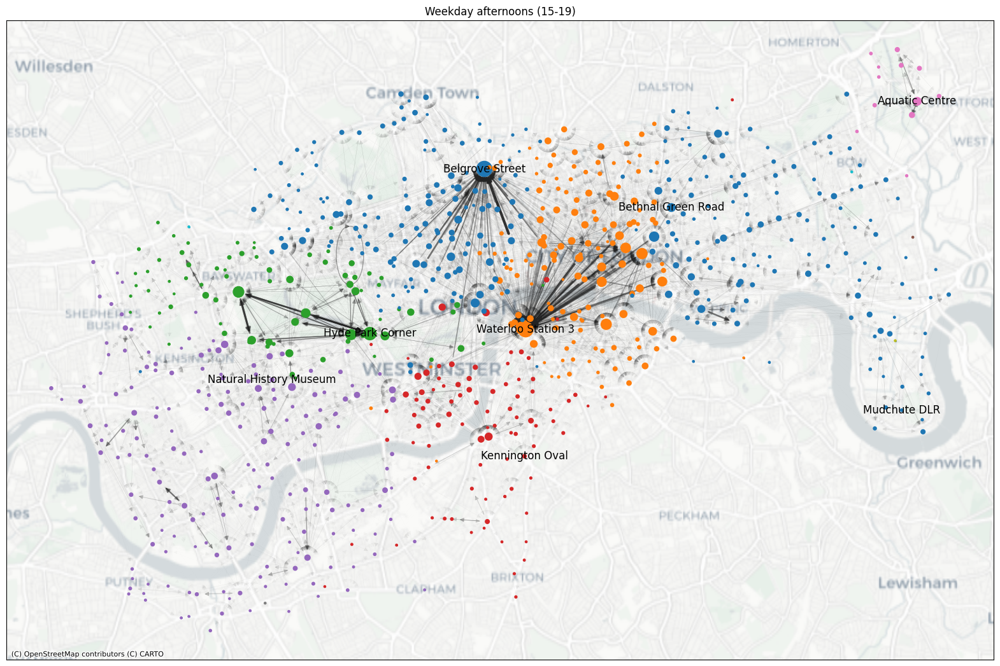

In [ ]:
print("Plotting afternoons")
df_year_afternoons = df[
    df["start_date"].dt.hour.isin([15, 16, 17, 18, 19])
    & df["start_date"].dt.weekday.isin((0, 1, 2, 3, 4))
]
fig, ax, nodes_info = create_network_and_map(df_year_afternoons)
num_communities = len(nodes_info["partition"].unique())
print(f"Number of communities: {num_communities}")
plt.title("Weekday afternoons (15-19)")
plt.show()



Plotting weekends
Number of communities: 25


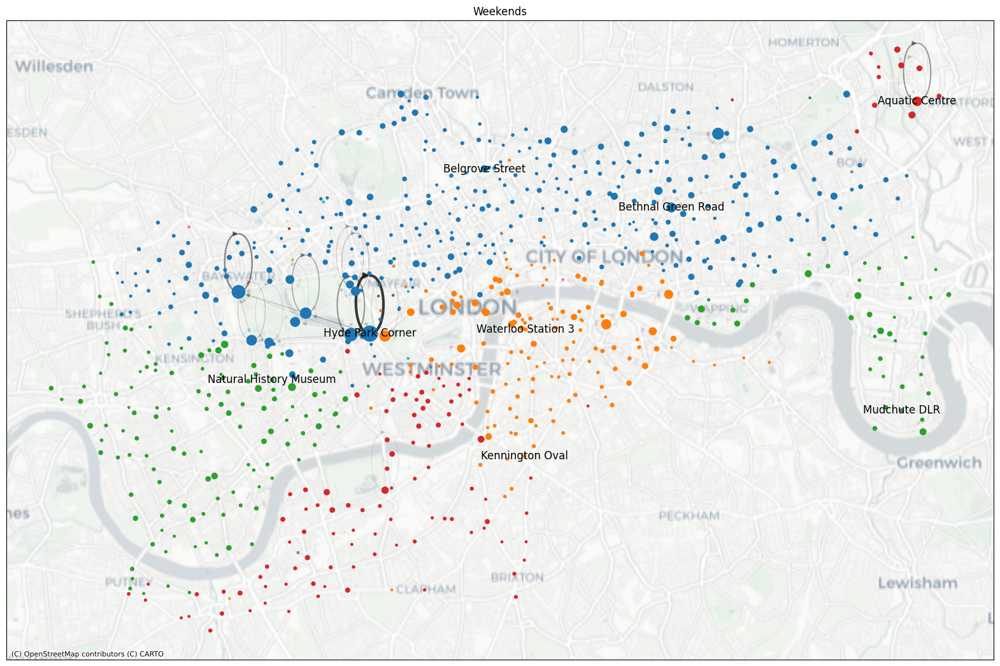

In [ ]:
print("Plotting weekends")
df_year_weekends = df[df["start_date"].dt.weekday.isin((5, 6))]
fig, ax, nodes_info = create_network_and_map(
    df_year_weekends,
    allow_self_loops=True,
)
num_communities = len(nodes_info["partition"].unique())
print(f"Number of communities: {num_communities}")
plt.title("Weekends")
plt.show()


Plotting 2013
Number of communities: 6


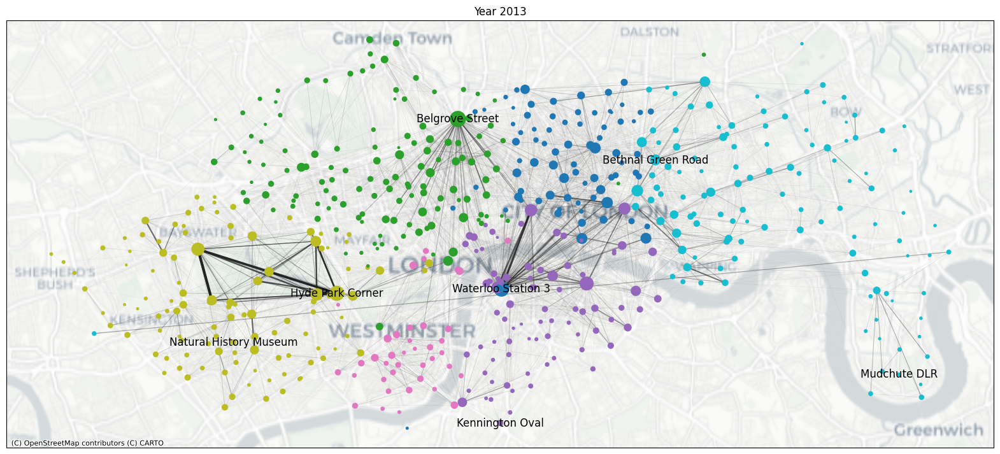

Plotting 2017
Number of communities: 10


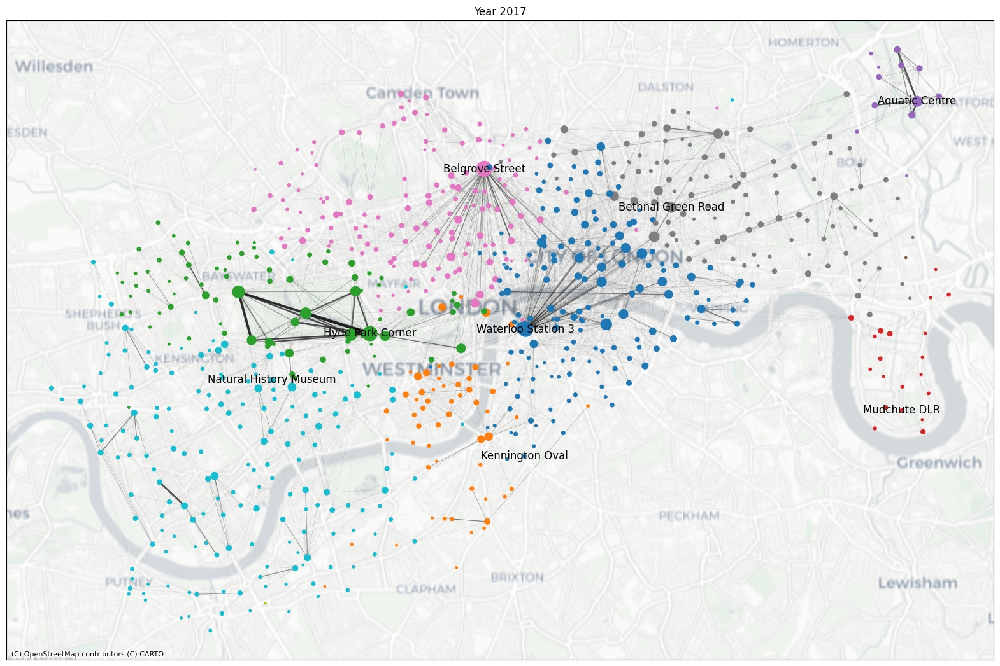

Plotting 2020
Number of communities: 12


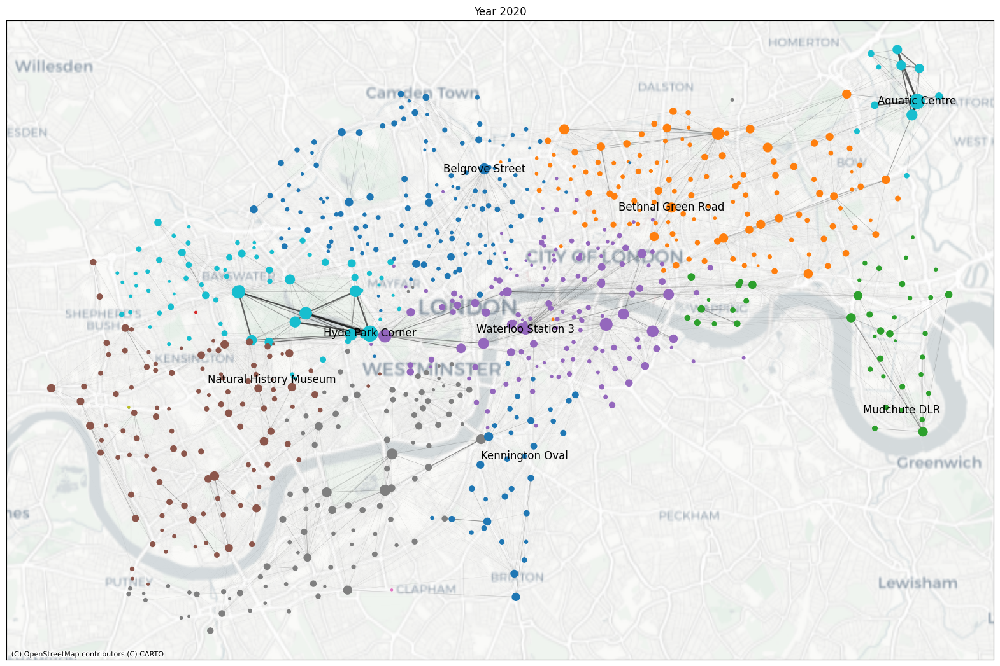

Plotting 2021
Removing node 0 because of missing location data.
Number of communities: 11


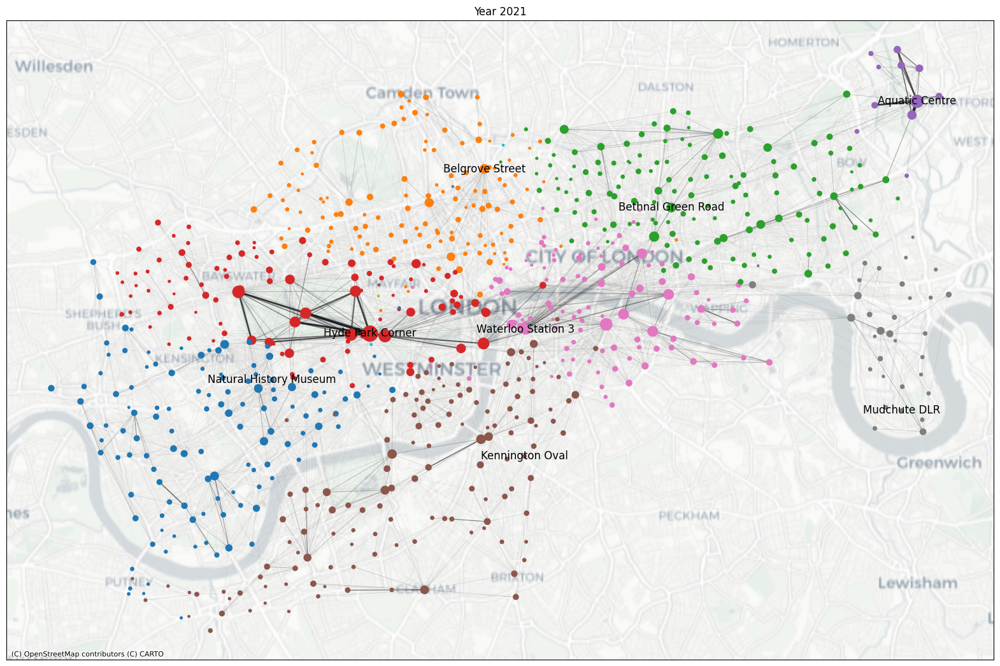

In [ ]:
for year in (2013, 2017, 2020,2021):
    print(f"Plotting {year}")
    start_date = datetime(year=year, month=1, day=1)
    end_date = datetime(year=year + 1, month=1, day=1)
    df_year = df[
        (df["start_date"] > start_date) & (df["start_date"] < end_date)
    ]
    fig, ax, nodes_info = create_network_and_map(
        df_year,
        allow_self_loops=False,
        arrows=False,
    )
    num_communities = len(nodes_info["partition"].unique())
    print(f"Number of communities: {num_communities}")
    plt.title(f"Year {year}")
    plt.show()
